# Image Sharpening using Different Filters

In [1]:
import cv2
import numpy as np

from matplotlib import pyplot as plt

## Base Image

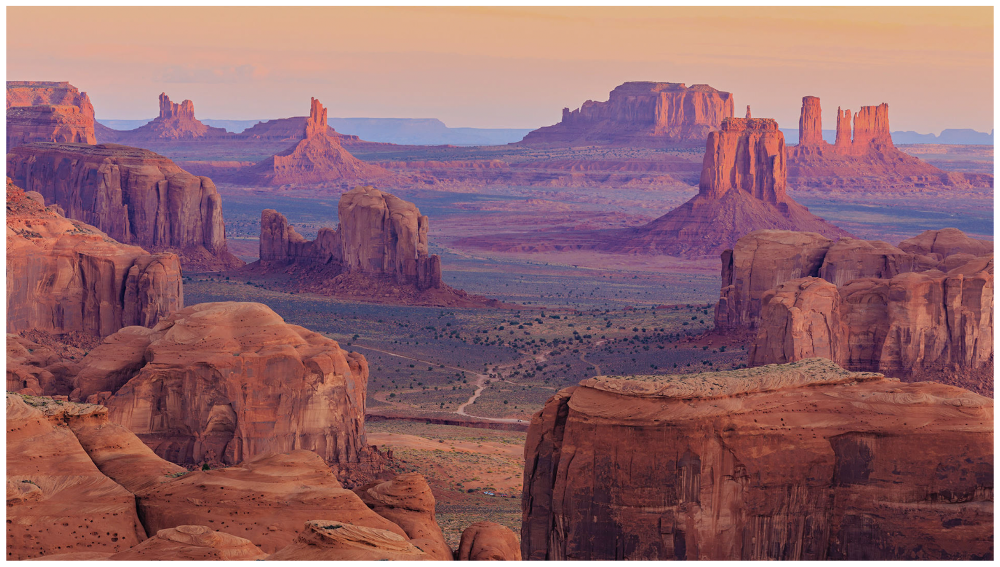

In [2]:
base_image = cv2.cvtColor(cv2.imread("images/hunts-mesa.jpg"), cv2.COLOR_BGR2RGB) / 255.0

plt.figure(figsize=(20, 20))
plt.imshow(base_image)
plt.axis("off")
plt.show()

## Gaussian Filter

In [3]:
def imsharp_gaussian(input_image, filter_size, filter_std):
    
    # Apply Gaussian filter to blur input image
    gaussian_image = cv2.GaussianBlur(input_image, (filter_size, filter_size), filter_std)
    
    # Take difference between input image and Gaussian to get unsharp mask
    unsharp_mask = input_image - gaussian_image
    
    # Add Laplacian to input image
    output_image = input_image + unsharp_mask * 0.5
    
    return output_image.clip(0, 1)

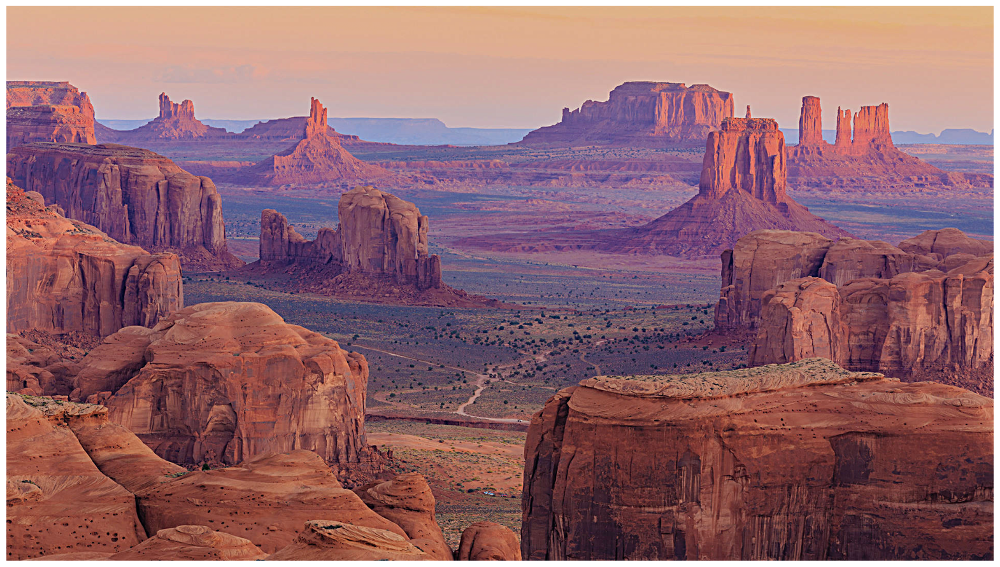

In [4]:
output_gaussian = imsharp_gaussian(base_image, 15, 5)

plt.figure(figsize=(20, 20))
plt.imshow(output_gaussian)
plt.axis("off")
plt.show()

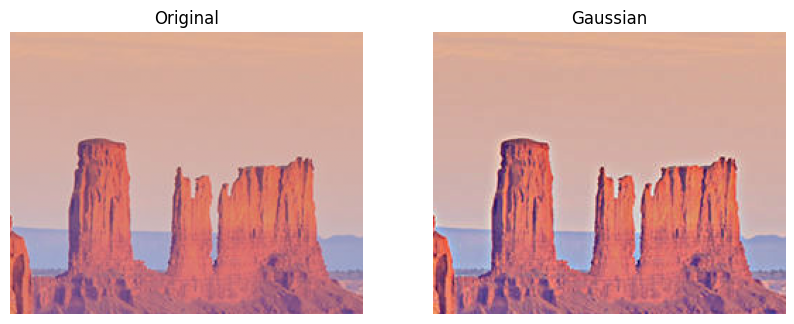

In [5]:
fig, ax = plt.subplots(1, 2, figsize=(10, 10))

ax[0].imshow(base_image[100:300, 1500:1750, :])
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(output_gaussian[100:300, 1500:1750, :])
ax[1].set_title("Gaussian")
ax[1].axis("off")

plt.show()

## Bilateral Filter

In [9]:
def imsharp_bilateral(input_image, diameter, sigma_r, sigma_s):
    
    # Apply bilateral filter to blur input image
    bilateral_image = cv2.bilateralFilter(input_image.astype(np.float32), d=diameter, sigmaColor=sigma_r, sigmaSpace=sigma_s)
    
    # Take difference between input image and bilateral to get unsharp mask
    unsharp_mask = input_image - bilateral_image
    
    # Add sharpening mask to input image
    output_image = input_image + unsharp_mask * 0.5
    
    return output_image.clip(0, 1)

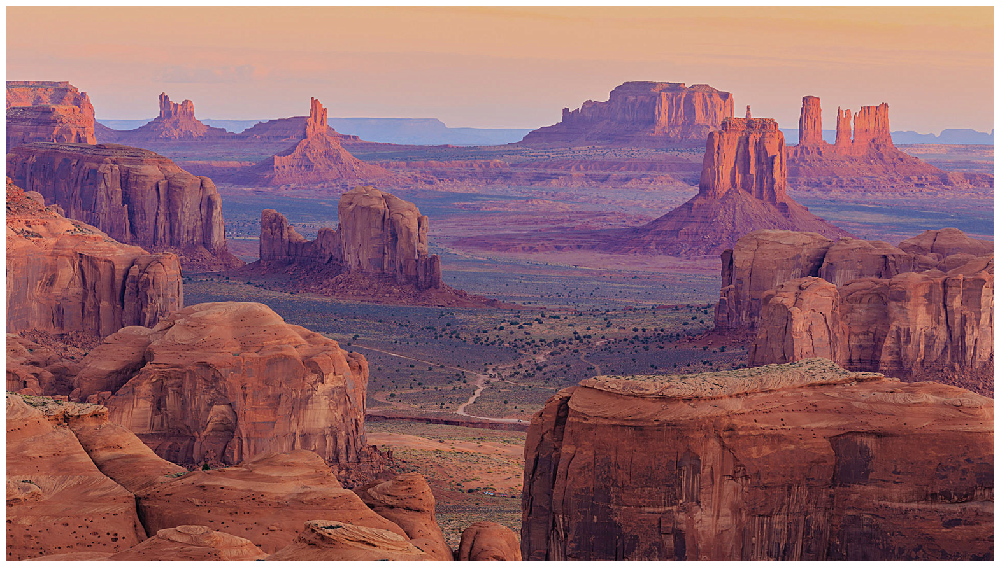

In [10]:
output_bilateral = imsharp_bilateral(base_image, 9, 75, 75)

plt.figure(figsize=(20, 20))
plt.imshow(output_bilateral)
plt.axis("off")
plt.show()

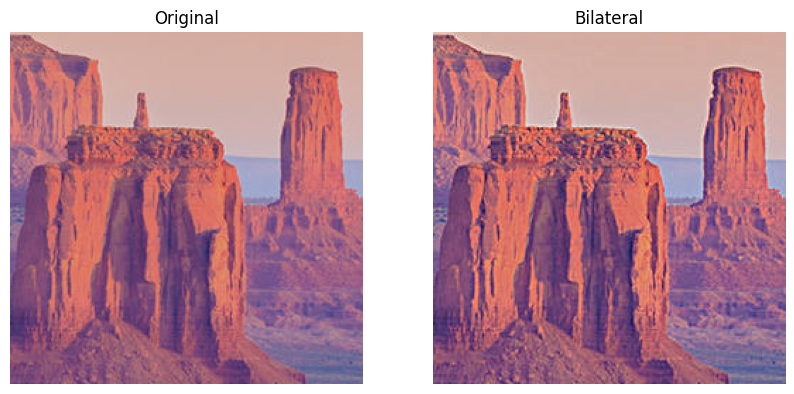

In [8]:
fig, ax = plt.subplots(1, 2, figsize=(10, 10))

ax[0].imshow(base_image[150:400, 1350:1600, :])
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(output_bilateral[150:400, 1350:1600, :])
ax[1].set_title("Bilateral")
ax[1].axis("off")

plt.show()

## Adaptive Bilateral Filter (ABF)